In [2]:

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

import pickle
import random
import os
import sys

import torch.nn as nn
import torch

import plotly.express as px

import itertools

from sklearn.preprocessing import StandardScaler
from scipy.signal import savgol_filter
from sklearn.metrics import pairwise_distances


from sklearn.decomposition import PCA, KernelPCA
from sklearn.manifold import LocallyLinearEmbedding, SpectralEmbedding, MDS

from sklearn.neighbors import LocalOutlierFactor

from MARBLE import utils, geometry, net, plotting, postprocessing, compare_attractors

## analysing data without vectors or inner products

In [3]:

with open('./outputs/distance_matrices_and_embeddings_1ms_test.pkl', 'rb') as handle:
    data = pickle.load(handle)

distance_matrices = data[0]
embeddings = data[1]
timepoints = data[2]
labels = data[3]

conditions=['DownLeft','Left','UpLeft','Up','UpRight','Right','DownRight']  

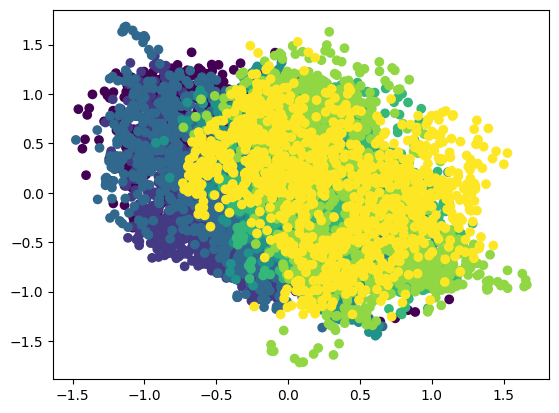

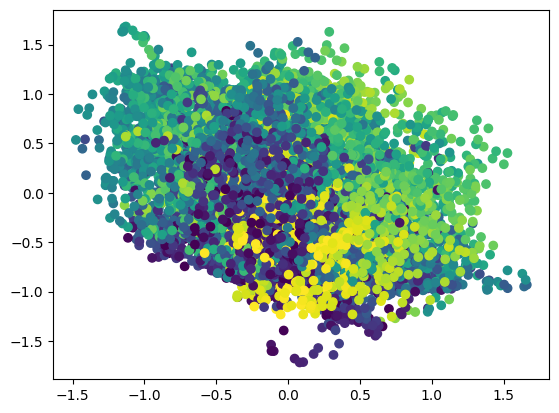

In [4]:
plt.scatter(embeddings[-1][:,0], embeddings[-1][:,2],c=labels[-1])

plt.figure()
plt.scatter(embeddings[-1][:,0], embeddings[-1][:,2],c=np.hstack(timepoints[-1]))

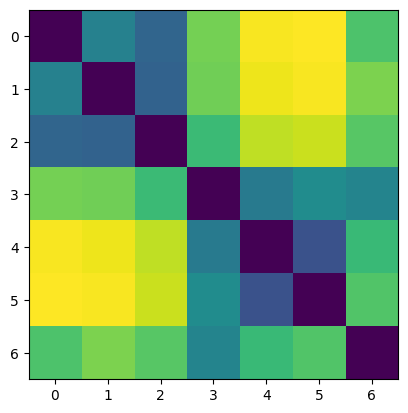

In [8]:
plt.imshow(distance_matrices[-1])

In [32]:

# Import dependencies
import plotly
import plotly.graph_objs as go

# Configure Plotly to be rendered inline in the notebook.
plotly.offline.init_notebook_mode()

emb = embeddings[-1]
label = labels[-1]
time = np.hstack(timepoints[-1])
# Configure the trace.
data = []

for i in range(7):
    trace = go.Scatter3d(
        x=emb[label==i,0],  
        y=emb[label==i,1],  
        z=emb[label==i,2],  
        mode='markers',
        marker={
            'size': time[label==i]/50,
            'opacity': 0.8,
        }
    )
    data.append(trace)

# Configure the layout.
layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0}
)

#data = [trace]

plot_figure = go.Figure(data=data, layout=layout)

# Render the plot.
plotly.offline.iplot(plot_figure)


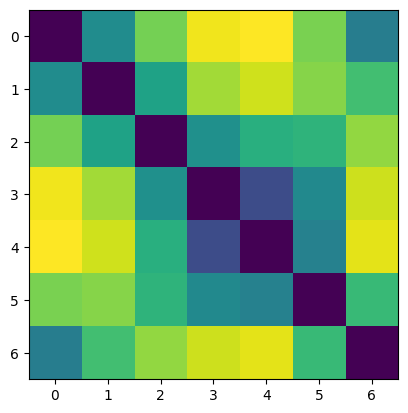

In [33]:
plt.imshow(distance_matrices[-1])

### average distance matrix when using distances based on clustering

Performed MDS embedding on embedded results.


/home/robert/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.



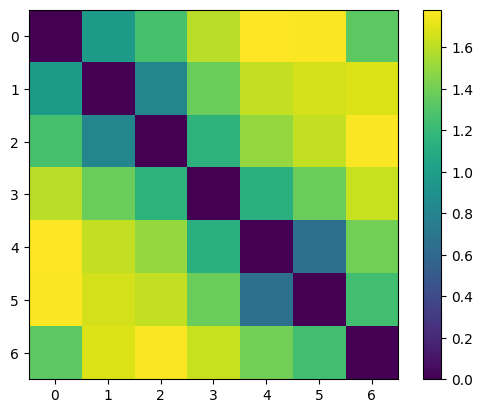

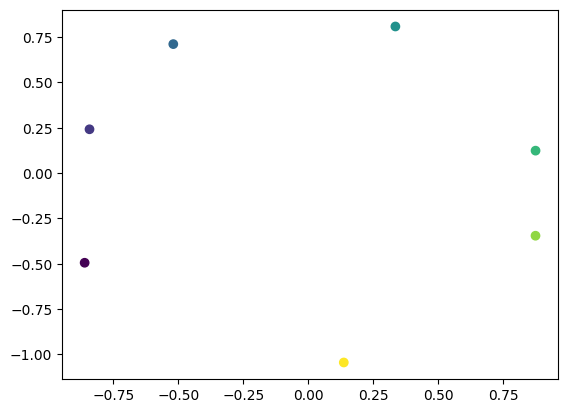

In [34]:
# plot average distance matrix based on clustering
plt.figure()
plt.imshow(np.mean(np.dstack(distance_matrices),2)); plt.colorbar()  

emb_MDS, _ = geometry.embed(np.mean(np.dstack(distance_matrices),2), embed_typ = 'MDS')
plt.figure()
plt.scatter(emb_MDS[:,0],emb_MDS[:,1],c=np.linspace(0,6,7))

## average distance matrix when recomputing distance based on embedding

In [35]:
# compute distance between conditions for each session

distance_matrices = []

for d in range(len(embeddings)):
    
    embedding = embeddings[d]
    label = np.hstack(labels[d])
    times = np.hstack(timepoints[d])
    
    sub_embeddings = []
    
    for c,cond in enumerate(conditions):
        indexes =  (label==c)
        sub_emb = embedding[indexes].numpy()
        sub_embeddings.append(sub_emb)
            
    
    distances = np.zeros([len(sub_embeddings), len(sub_embeddings)])
    for i in range(len(sub_embeddings)):
        for j in range(len(sub_embeddings)):
            if i==j:
                distances[i,j] = 0
            else:
                distances[i,j] = pairwise_distances(sub_embeddings[i],sub_embeddings[j]).mean()
                
    distances = distances/np.std(distances)
    
    distance_matrices.append(distances)
    

Performed MDS embedding on embedded results.


/home/robert/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.



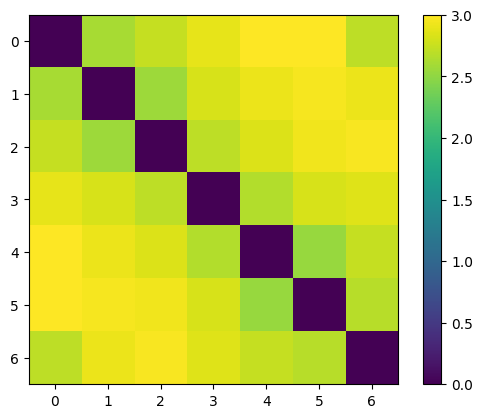

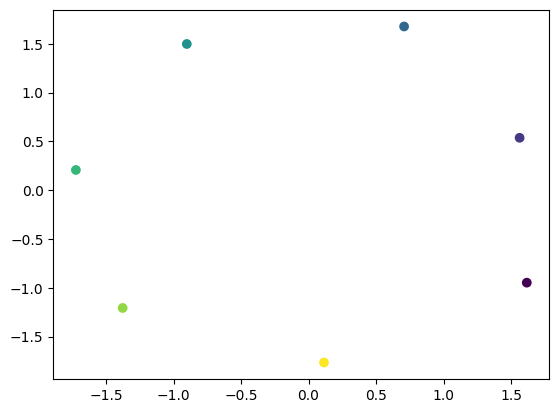

In [36]:
# plot average distance matrix
plt.figure()
plt.imshow(np.mean(np.dstack(distance_matrices),2)); plt.colorbar()  

emb_MDS, _ = geometry.embed(np.mean(np.dstack(distance_matrices),2), embed_typ = 'MDS')
plt.figure()
plt.scatter(emb_MDS[:,0],emb_MDS[:,1],c=np.linspace(0,6,7))

### individual session distances 

/home/robert/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.

/home/robert/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.

/home/robert/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.



Performed MDS embedding on embedded results.
Performed MDS embedding on embedded results.
Performed MDS embedding on embedded results.


/home/robert/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.

/home/robert/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.

/home/robert/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.

/home/robert/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_st

Performed MDS embedding on embedded results.
Performed MDS embedding on embedded results.
Performed MDS embedding on embedded results.
Performed MDS embedding on embedded results.
Performed MDS embedding on embedded results.
Performed MDS embedding on embedded results.


/home/robert/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.

/home/robert/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.

/home/robert/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.



Performed MDS embedding on embedded results.
Performed MDS embedding on embedded results.


/home/robert/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.



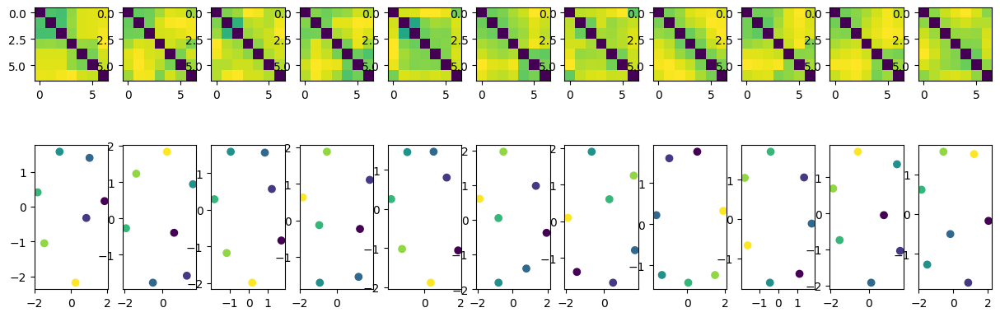

In [37]:

examples = [2,3,4,5,8,9,10,11,12,13,14]
fig, axs = plt.subplots(2,len(examples),figsize=(15,5))

for i,idx in enumerate(examples):
    axs[0, i].imshow(distance_matrices[idx])
    
    emb_MDS, _ = geometry.embed(distance_matrices[idx], embed_typ = 'MDS')
    axs[1, i].scatter(emb_MDS[:,0],emb_MDS[:,1],c=np.linspace(0,6,7))
    


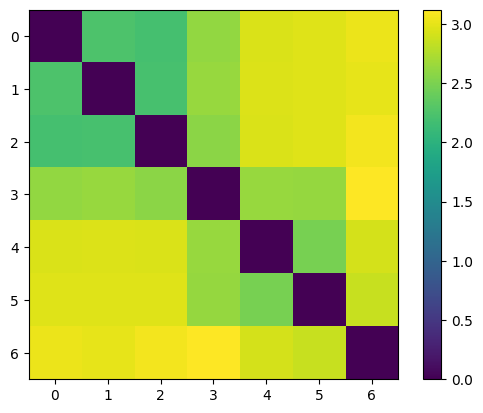

In [39]:
plt.figure()
plt.imshow(distance_matrices[2]); plt.colorbar()  

### averaged across sessions

### Shifting time periods

In [40]:
time_periods = np.arange(0,137,10)


distance_matrices = []
for d in range(len(embeddings)):
    
    embedding = embeddings[d]
    label = np.hstack(labels[d])
    times = np.hstack(timepoints[d])
    
    sub_embeddings = []
    
    for c,cond in enumerate(conditions):
        for period  in time_periods:
            indexes =  (label==c) * (times==period) #* (times>=period[0]) * (times<period[1])
            sub_emb = embedding[indexes].numpy()
            
            sub_embeddings.append(sub_emb)
            
    
    distances = np.zeros([len(sub_embeddings), len(sub_embeddings)])
    for i in range(len(sub_embeddings)):
        for j in range(len(sub_embeddings)):
            if i==j:
                distances[i,j] = 0
            else:
                distances[i,j] = pairwise_distances(sub_embeddings[i],sub_embeddings[j]).mean()
    
    distances = distances/np.std(distances)
    
    distance_matrices.append(distances)
    
    
            
            

In [41]:
distance_matrix = np.mean(np.dstack(distance_matrices),2)


/home/robert/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.



Performed MDS embedding on embedded results.


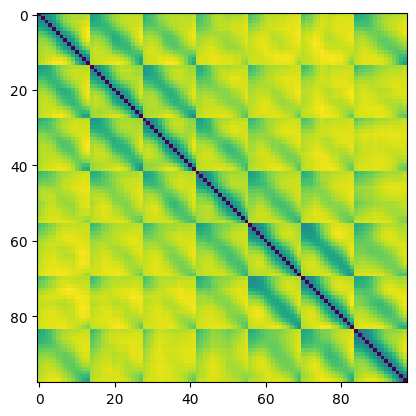

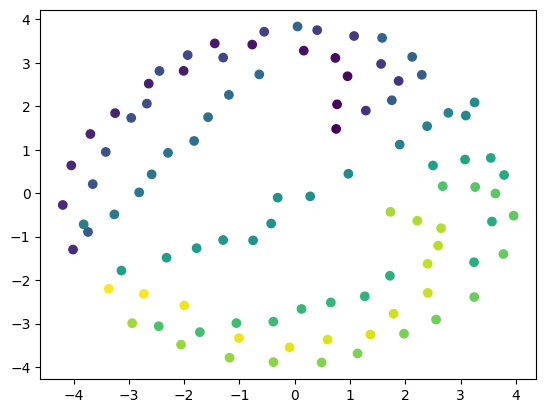

In [42]:
plt.figure()
plt.imshow(distance_matrix)

emb_MDS, _ = geometry.embed(distance_matrix, embed_typ = 'MDS')
plt.figure()
plt.scatter(emb_MDS[:,0],emb_MDS[:,1],c=np.linspace(0,distance_matrix.shape[0]-1,distance_matrix.shape[0]))



In [43]:

# Import dependencies
import plotly
import plotly.graph_objs as go

# Configure Plotly to be rendered inline in the notebook.
plotly.offline.init_notebook_mode()


emb_MDS, _ = geometry.embed(distance_matrix, dim_emb=3, embed_typ = 'MDS')


# Configure the trace.
data = []

for i in range(7):
    trace = go.Scatter3d(
        x=emb_MDS[i*7:i*7+7,0],  
        y=emb_MDS[i*7:i*7+7,1],  
        z=emb_MDS[i*7:i*7+7,2],  
        mode='markers',
        marker={
            'size': np.linspace(1,7,7)*2,
            'opacity': 0.8,
        }
    )
    data.append(trace)

# Configure the layout.
layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0}
)

#data = [trace]

plot_figure = go.Figure(data=data, layout=layout)

# Render the plot.
plotly.offline.iplot(plot_figure)


/home/robert/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.



Performed MDS embedding on embedded results.


### Increasing time periods



In [ ]:

time_periods = np.arange(0,137,3)


distance_matrices = []
for d in range(len(embeddings)):
    
    embedding = embeddings[d]
    label = np.hstack(labels[d])
    times = np.hstack(timepoints[d])
    
    sub_embeddings = []
    
    for c,cond in enumerate(conditions):
        for period  in time_periods:
            indexes =  (label==c) * (times>=period) 
            sub_emb = embedding[indexes].numpy()
            
            sub_embeddings.append(sub_emb)
            
    
    distances = np.zeros([len(sub_embeddings), len(sub_embeddings)])
    for i in range(len(sub_embeddings)):
        for j in range(len(sub_embeddings)):
            if i==j:
                distances[i,j] = 0
            else:
                distances[i,j] = pairwise_distances(sub_embeddings[i],sub_embeddings[j]).mean()
    
    distances = distances/np.std(distances)
    
    distance_matrices.append(distances)
    
            
            

In [ ]:
distance_matrix = np.mean(np.dstack(distance_matrices),2)


In [ ]:
plt.figure()
plt.imshow(distance_matrix)

emb_MDS, _ = geometry.embed(distance_matrix, embed_typ = 'MDS')
plt.figure()
plt.scatter(emb_MDS[:,0],emb_MDS[:,1],c=np.linspace(0,distance_matrix.shape[0]-1,distance_matrix.shape[0]))

In [ ]:

# Import dependencies
import plotly
import plotly.graph_objs as go

# Configure Plotly to be rendered inline in the notebook.
plotly.offline.init_notebook_mode()


emb_MDS, _ = geometry.embed(distance_matrix, dim_emb=3, embed_typ = 'MDS')


# Configure the trace.
data = []

for i in range(7):
    trace = go.Scatter3d(
        x=emb_MDS[i*7:i*7+7,0],  
        y=emb_MDS[i*7:i*7+7,1],  
        z=emb_MDS[i*7:i*7+7,2],  
        mode='markers',
        marker={
            'size': np.linspace(1,7,7)*2,
            'opacity': 0.8,
        }
    )
    data.append(trace)

# Configure the layout.
layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0}
)

#data = [trace]

plot_figure = go.Figure(data=data, layout=layout)

# Render the plot.
plotly.offline.iplot(plot_figure)
